<a href="https://colab.research.google.com/github/daradanci/DeepLearning/blob/main/notebooks/Lab3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Лабораторная работа №3

# Задание



По заданию выбрать свои классы и обучить сверточную нейронную сеть c использованием техник дропаут и аугментации данных. Сравнить три варианта дропаута и три варианта аугментации данных.

Проанализировать результаты обучения в Tensorboard.

Отчет должен содержать: титульный лист, задание с вариантом, скриншоты и краткие пояснения по каждому этапу лабораторной работы, результаты обучения модели с разными параметрами аугментации данных, результаты tensorboard, итоговую таблицу со результатами для всех вариантов обучения.

Варианты классов использовать из 1 лабораторной работы.

# Задания для самостоятельной работы
1. Проанализируйте результаты обучения вашей модели. Как изменилась точность на обучающей и тестовой выборке по сравнению со сверточной моделью?
2. Попробуйте применить регуляризацию и аугментацию к модели из 2-ой лабораторной. Возникает ли переобучение вашей модели?
3. Измените вашу модель - сравните три варианта параметра дропаута по заданию. Сравните результаты обучения этих 3-ех вариантов
4. Измените 3 варианта штрафа за сложность модели. Проанализируйте результаты обучения.
5. Измените гиперпараметры обучения для повышения точности модели: количество эпох, размер батча, скорость обучения
6. Сравните три варианта аугментации данных: с маленьким коэффициентом, средним и большим. Проанализируйте результаты обучения.
7. Укажите, какие действия помогли повысить точность вашей модели и объясните почему.

# Контрольные вопросы для защиты
1. Что переобучение? Способы борьбы с ней.
2. Что такое дропаут, как выбирать значения для него?
3. Что такое штраф за сложность модели? Как влияет коэффициент штрафа?
4. Как работает сглаживание меток, для чего применяется?
5. Виды аугментации данных.
6. Что такое Tensorboard?

# Теория

## Методы и пояснения

Библиотеки:

* __time__ - стандартная библиотека Python, которая обеспечивает разнообразные функции, связанные со временем.
* __np__ - библиотека NumPy для работы с многомерными массивами данных
* __torchvision__ - библиотека является частью проекта PyTorch. Cостоит из популярных наборов данных, архитектур моделей и распространенных преобразований изображений для компьютерного зрения. В данной лабораторной будет использован модуль __transforms__ для аугментации данных
* __tensorflow__ - библиотека TensorFlow для глубокого обучения нейронных сетей, альтернатива PyTorch. В данной лабораторной будет использован модуль __summary__ для мониторинга моделей
* __torch__ - библиотека Pytorch для глубокого обучения нейронных сетей

### Методы и функции time:

(Подробнее в документации https://docs.python.org/3/library/time.html)

* __time.time__ - метод возвращает UNIX timestamp - количество секунд как число с палвающей точкой, прошедших с 1 января 1970 года 00:00:00 (UTC). На практике используется для замеров проивзодительности или генерации уникальных названий.
* __time.sleep__ - приостанавливает выполнение вызывающего потока на заданное количество секунд. Аргументом может быть число с плавающей запятой для указания более точного времени ожидания


### Методы и функции NumPy:

(Подробнее в документации https://numpy.org/doc/1.22/reference/index.html)

* __np.random.random__ - Генерирует случайное число с плавающей точкой в диапазоне от 0 до 1. Если передать кортеж размерностей параметру __size__, то сгенерирует многомерный массив, заполненный случайными величинами.


### Методы и функции torchvision
(Документация: https://pytorch.org/vision/stable/index.html)

В данной ЛР будет использоваться для аугментации изображений.

Принятые сокращения:
* __torchvision.transforms__ - T

Методы:
* __T.Compose__ - объединяет несколько преобразований вместе, для этого необходимо передать в качестве аргумента список, содержащий последовательно применяемые преобразования. По работе похож на __nn.Sequential__, рассмотренный в прошлых лаборатных.
* __T.ToTensor__ - преобразует изображение PIL или numpy.ndarray (H x W x C) в диапазоне [0, 255] в torch.FloatTensor размером (C x H x W) в диапазоне [0.0, 1.0], если изображение PIL принадлежит к одному из режимов (L, LA, P, I, F, RGB, YCbCr, RGBA, CMYK, 1) или если numpy.ndarray имеет dtype = np.uint8. В других случаях тензоры возвращаются без масштабирования.
* __T.ToPILImage__ - преобразует torch.*Tensor формы C x H x W или многомерный NumPy-массив формы H x W x C в изображение PIL с сохранением диапазона значений
* __T.ColorJitter__ - Случайным образом изменяет яркость, контрастность, насыщенность и оттенок изображения. Если изображение является тензором, ожидается, что оно будет иметь форму [..., 1 или 3, H, W], где ... означает произвольное количество. Если изображение является PIL-изображением, режимы “1”, “I”, “F” и режимы с прозрачностью (альфа-канал) не поддерживаются. Основные параметры:
 * __brightness__ (float или кортеж float (мин, макс)) – Насколько сильно изменять яркость. brightness_factor выбирается равномерно из [макс (0, 1 - яркость), 1 + яркость] или заданного [мин, макс]. Должны быть неотрицательными числами.
  * __contrast__ (float или кортеж float (мин, макс)) – Насколько сильно изменять контраст. Коэффициент контрастности выбирается равномерно из [макс(0, 1 - контраст), 1 + контраст] или заданного [мин, макс]. Должны быть неотрицательными числами.
  * __saturation__ (float или кортеж float (мин, макс)) – Насколько сильно изменять насыщенность. Коэффициент насыщенности выбирается равномерно из [макс(0, 1 - контраст), 1 + контраст] или заданного [мин, макс]. Должны быть неотрицательными числами.
  * __hue__ (float или кортеж float (мин, макс)) – Как сильно изменять оттенок. hue_factor выбирается равномерно из [-оттенок, оттенок] или заданного [мин, макс]. Должно быть 0 <= оттенок <= 0.5 или -0.5 <= мин <= макс <= 0.5.
* __T.RandomAffine__ - Случайное аффинное преобразование изображения, сохраняющее инвариантность центра. Если изображение является тензором, ожидается, что оно будет иметь форму [..., H, W], где ... означает произвольное количество ведущих измерений. Основные параметры:
 * __degrees__ (последовательность или число) – Диапазон градусов для выбора. Если градусы - это число, а не последовательность, например (мин, макс), диапазон градусов будет (-градусы, + градусы). Установите значение 0, чтобы отключить поворот.
 * __translate__ (кортеж, необязательно) – кортеж максимальной абсолютной доли для горизонтальных и вертикальных смещений. Например, translate=(a, b), тогда горизонтальный сдвиг выбирается случайным образом в диапазоне -img_width * a < dx < img_width * a, а вертикальный сдвиг выбирается случайным образом в диапазоне -img_height * b < dy < img_height * b. По умолчанию смещение не выполняется.
 * __scale__ (кортеж, необязательно) – интервал коэффициента масштабирования, например (a, b), затем масштаб выбирается случайным образом из диапазона a <= масштаб <= b. По умолчанию будет сохранен исходный масштаб.
 * __shear__ (последовательность или номер, необязательно) – Диапазон градусов на выбор. Если сдвиг является числом, то будет применен сдвиг, параллельный оси x в диапазоне (-сдвиг, +сдвиг). В противном случае, если сдвиг представляет собой последовательность из 2 значений, будет применен сдвиг, параллельный оси x в диапазоне (сдвиг [0], сдвиг[1]). В противном случае, если сдвиг представляет собой последовательность из 4 значений, будет применен сдвиг по оси x (сдвиг[0], сдвиг[1]) и сдвиг по оси y (сдвиг[2], сдвиг[3]). По умолчанию сдвиг не применяется.
* __T.RandomHorizontalFlip__ - горизонтально отражает заданное изображение случайным образом с заданной вероятностью. Если изображение является тензором факела, ожидается, что оно будет иметь форму [..., H, W], где ... означает произвольное количество ведущих измерений. Вероятность отражения определяется параметром __p__. Ожидается значение от 0 до 1.
* __T.RandomVerticalFlip__ - то же самое, что и __T.RandomHorizontalFlip__, но вертикальное отражение.
* __T.RandomResizedCrop__ - обрезает произвольную часть изображения и изменяет ее размер до заданного размера. Если изображение является тензором, ожидается, что оно будет иметь форму [..., H, W], где ... означает произвольное количество ведущих измерений. Производится обрезка исходного изображения: обрезка имеет случайную площадь (H * W) и случайное соотношение сторон. После чего обрезка будет изменена до заданного размера. Данная аугментация широко используется для обучения свёрточных нейронных сетей. Основные параметры:
 * __size__ (int или кортеж) – ожидаемый размер выходной обрезки для каждого края. Если размер является int вместо кортежа, такого как (h, w), создается квадратный размер формой (размер, размер). Если указан кортеж длиной 1, он будет интерпретироваться как (размер[0], размер[0]).
 * __scale__ (кортеж float) – определяет нижнюю и верхнюю границы случайной области обрезки перед изменением размера. Масштаб определяется по отношению к площади исходного изображения.
 * __ratio__ (кортеж float) – нижняя и верхняя границы для случайного соотношения сторон обрезки перед изменением размера.
* __T.RandomRotation__ - соответствует __T.RandomAffine__, когда все параметры кроме __degrees__ 0. Однако становится возможным указать центр вращения при помощи параметра __center__ как кортеж (x, y). Начало координат находится в левом верхнем углу. По умолчанию используется центр изображения.
* __T.Resize__ - изменяет размер входного изображения до заданного размера. Если изображение является тензором, ожидается, что оно будет иметь форму [..., H, W], где ... означает произвольное количество ведущих измерений. Выходной размер определяется параметром __size__ как кортеж (h,w). По факту вызывает метод __PIL.Image.resize__, рассмотренный раннее.
* __T.RandomPerspective__ - выполняет случайное преобразование перспективы данного изображения с заданной вероятностью. Если изображение является тензором, ожидается, что оно будет иметь форму [..., H, W], где ... означает произвольное количество ведущих измерений. Основные параметры:
 * __distortion_scale__ (float) – аргумент для управления степенью искажения, находится в диапазоне от 0 до 1. Значение по умолчанию равно 0.5
 * __p__ (float) – вероятность преобразования изображения. Значение по умолчанию равно 0.5
* __T.RandomCrop__ - обрезает заданное изображение в случайном месте. Если изображение является тензором, ожидается, что оно будет иметь форму [..., H, W], где ... означает произвольное количество ведущих измерений, но если используется нецелое заполнение, ожидается, что входные данные будут иметь не более 2 ведущих измерений. Основные параметры:
 * __size__ (кортеж или int) – желаемый выходной размер обрезки. Если размер является int вместо кортежа (h, w), создается квадратная обрезка (размер, размер). Если указана последовательность длиной 1, она будет интерпретироваться как (размер[0], размер[0])
 * __padding__ (int или кортеж, необязательно) – необязательное заполнение на каждой границе изображения. Значение по умолчанию - None. Если указан один int, он используется для заполнения всех границ. Если указан кортеж длины 2, то это отступ слева/справа и сверху/снизу соответственно. Если указан кортеж длиной 4, то это заполнение для левой, верхней, правой и нижней границ соответственно.
 * __padding_mode__ (str) – тип заполнения. Должно быть: constant, edge, reflect или symmetric. По умолчанию constant. constant: поля с постоянным значением, это значение указывается с помощью параметра __fill__. edge: поля с последним значением на краю изображения. Если ввести тензор 5D, последние 3 измерения будут дополнены вместо последних 2. reflect: заполнение с отражением изображения без повторения последнего значения на краю. Например, результатом заполнения [1, 2, 3, 4] 2 элементами с обеих сторон в режиме отражения будет [3, 2, 1, 2, 3, 4, 3, 2]. symmetric: заполнение с отражением изображения, повторяющего последнее значение на краю. Например, результатом заполнения [1, 2, 3, 4] 2 элементами с обеих сторон в режиме отражения будет [2, 1, 1, 2, 3, 4, 4, 3]
* __T.GaussianBlur__ - размывает изображение с помощью случайно выбранного размытия по Гауссу. Если изображение является тензором, ожидается, что оно будет иметь форму [..., C, H, W], где ... означает произвольное количество ведущих измерений. Параметр __kernel_size__ задаёт размер ядра фильтра Гаусса. Параметр __sigma__ задаёт стандартное отклонение, которое будет использоваться для создания ядра для выполнения размытия. Если float, __sigma__ постоянна. Если это кортеж с плавающей точкой (min, max), __sigma__ выбирается равномерно случайным образом, чтобы лежать в заданном диапазоне.
* __T.RandomInvert__ - инвертирует цвета данного изображения случайным образом с заданной вероятностью __p__. Если изображение является тензором, ожидается, что он будет в формате [..., 1 или 3, H, W], где ... означает, что он может иметь произвольное количество начальных измерений. Если изображение является PIL-изображением, ожидается, что оно будет находиться в режиме "L" или "RGB".
* __T.RandomPosterize__ - постеризует изображение случайным образом с заданной вероятностью __p__, уменьшая количество битов для каждого цветового канала параметром __bits__ (целое число от 0 до 8). Если изображение является тензором, оно должно быть типа torch.uint8, и ожидается, что оно будет иметь форму [..., 1 или 3, H, W], где ... означает произвольное количество ведущих измерений. Если изображение является PIL-изображением, ожидается, что оно будет находиться в режиме "L" или "RGB".
* __T.RandomSolarize__ - cоляризует изображение случайным образом с заданной вероятностью __p__, инвертируя все значения пикселей выше порогового значения __threshold__. Если изображение является тензором, ожидается, что оно будет в формате [..., 1 или 3, H, W], где ... означает, что он может иметь произвольное количество начальных измерений. Если изображение является PIL-изображением, ожидается, что оно будет находиться в режиме "L" или "RGB".
* __T.RandomAdjustSharpness__ - регулирует резкость изображения случайным образом с заданной вероятностью __p__. Параметр __sharpness_factor__ (float) – как сильно нужно отрегулировать резкость. Может быть любым неотрицательным числом. 0 дает размытое изображение, 1 дает исходное изображение, в то время как 2 увеличивает резкость в 2 раза. Если изображение является тензором факела, ожидается, что оно будет иметь форму [..., 1 или 3, H, W], где ... означает произвольное количество ведущих измерений.
* __T.RandomEqualize__ - выравнивает гистограмму данного изображения случайным образом с заданной вероятностью __p__. Если изображение является тензором, ожидается, что оно будет иметь форму [..., 1 или 3, H, W], где ... означает произвольное количество ведущих измерений. Если изображение является PIL-изображением, ожидается, что оно будет находиться в режиме "P", "L" или "RGB".
* __T.RandomGrayscale__ - cлучайным образом преобразует изображение в оттенки серого с вероятностью __p__ (по умолчанию 0,1). Если изображение является тензором, ожидается, что оно будет иметь форму [..., 3, H, W], где ... означает произвольное количество ведущих измерений. Версия входного изображения в оттенках серого с вероятностью p и исходного с вероятностью (1-p). - Если входное изображение имеет 1 канал: версия в оттенках серого - 1 канал - Если входное изображение имеет 3 канала: версия в оттенках серого - 3 канала с r == g == b.
* __T.Normalize__ - нормализует тензорное изображение со средним значением и стандартным отклонением. Это преобразование не поддерживает изображения PIL. Учитывая __mean__: (среднее[1],..., среднее[n]) и __std__: (std[1],..,std[n]) для n каналов, это преобразование приведет к нормализации каждого канала входного torch.*Tensor, т.е. выходной[канал] = (входной[канал] - среднее значение [канал]) / std[канал]
* __T.RandomErasing__ - cлучайным образом выбирает прямоугольную область в тензорном изображении и стирает ее пиксели. Это преобразование не поддерживает изображение PIL. Основные параметры:
 * __p__ – вероятность того, что будет выполнена операция случайного стирания.
 * __scale__ – диапазон соотношения удаляемой области к входному изображению.
 * __ratio__ - диапазон соотношения сторон стертой области.
 * __value__ - стирающее значение. Значение по умолчанию равно 0. Если один int, он используется для удаления всех пикселей. Если кортеж длиной 3, он используется для стирания каналов R, G, B соответственно. Если строка "random", стираем каждый пиксель случайными значениями.
* __T.RandomChoice__ - Применяет одно преобразование, случайно выбранное из списка __transforms__ с вероятностью __p__.
* __T.AutoAugment__ - Автоматическое аугментация как метод увеличения данных,  может повысить точность моделей классификации изображений. Хотя набор аугментаций напрямую связан с их набором данных, эмпирические исследования показывают, что политики ImageNet обеспечивают значительные улучшения при применении к другим наборам данных. В TorchVision были внедрены 3 политики, изученные на следующих наборах данных: ImageNet, CIFAR10 и SVHN. Новое преобразование может использоваться отдельно или в сочетании с существующими преобразованиями. Если изображение является тензором, оно должно быть типа torch.uint8, и ожидается, что оно будет иметь форму [..., 1 или 3, H, W], где ... означает произвольное количество ведущих измерений. Если изображение является PIL-изображением, ожидается, что оно будет находиться в режиме "L" или "RGB". Основные параметры:
 * __policy__ - одно из: __T.AutoAugmentPolicy.IMAGENET__, __T.AutoAugmentPolicy.CIFAR10__, __T.AutoAugmentPolicy.SVHN__
  * __fill__ (кортеж или число, необязательно) – значение пиксельной заливки для области за пределами преобразованного изображения. Если задано число, то значение используется для всех каналов соответственно.

Посмотреть демонстрацию применённых преобразований можно тут: https://pytorch.org/vision/stable/auto_examples/plot_transforms.html#sphx-glr-auto-examples-plot-transforms-py




### Методы и функции Tensorflow
(Документация: https://www.tensorflow.org/api_docs)


Данная библиотека содержит множество полезных модулей, которые пригодятся в повседневной практике. В данной лабораторной работе будет использован лишь модуль __summary__ для взаимодействия с Tensorboard.

Для избежания конфликтов с __torchsummary__, данный модуль будет обозначаться как __tfsummary__

* __tfsummary__ - модуль tf.summary предоставляет API-интерфейсы для записи сводных данных. Эти данные можно визуализировать в TensorBoard, инструменте визуализации, который поставляется вместе с TensorFlow. Простейший пример использования:


    writer = tfsummary.create_file_writer("mylogs")
    with writer.as_default():
      for step in range(100):
        ...
        tfsummary.scalar("my_metric", 0.5, step=step)
        writer.flush()

* __tfsummary.create_file_writer__ - создает средство записи сводных файлов для данного файла
* __tfsummary.scalar__ - создает скалярное число
* __tfsummary.flush__ - заставляет средство записи сводок отправлять любые буферизованные данные в хранилище


### Практика

__Создание собственных датасетов__:

Для создания собственного PyTorch-датасета необходимо выполнить наследование от класса __torch.utils.data.Dataset__. Кроме этого необходимо перегрузить 3 метода: __init__, __len__ и __get_item__. Пример наследования:

    class CifarDataset(torch.utils.data.Dataset):
        def __init__(self, X, y):
            assert X.size(0) == y.size(0)
            super(Dataset, self).__init__()
            self.X = X
            self.y = y
            
        def __len__(self):
            return self.y.size(0)
            
        def __getitem__(self, index):
            x = self.X[index]
            y = self.y[index]
            return x, y

После чего его можно так же передавать в DataLoader.



__Аугментация изображений__:

Различают две стратегии аугментации: offline-аугментация и online-агументация. Первый вид предполагает заблаговременное расширение обучающей выборки за счёт добавления в неё преобразованных и искаженных копий. Так, например, если отразить изображения по горизонтали и вертикали, получится увеличить объём обучающей выборки в 4 раза:
* 1х оригинальный датасет
* 2х - оригинальный + горизонтальное отражение
* 3х - оригинальный + горизонтальное отражение + вертикальное отражение
* 4х - оригинальный + горизонтальное отражение + вертикальное отражение + оба отражения одновременно

После расширения обучающей выборки она используется для обучения.

Такой подход имеет следующие недостатки:
* Применяется лишь ограниченное число преобразований из числа возможных (например, при использовании преобразования поворота на целое число градусов)
* Увеличивается размер выборки, который необходимо держать в оперативной памяти или на жестком диске. Для больших наборов данных с миллионами примеров это непозволительная роскошь.

Есть и преимущество:
* Преобразования выполняются лишь раз, поэтому при обучении нейросети доступно больше вычислительных ресурсов.

На практике всё чаще используются online-аугментации данных. Такие аугментации выполняются параллельно с обучением нейронной сети. В свою очередь это сказывается на скорости обучения: если минибатч не готов к моменту, когда обновление весов уже произошло и происходит переход к следующей итерации, вычислительные ресурсы (GPU) ожидают и простаивают. Поэтому на практике часто используют параллельные вычисления на процессорных ядрах, чтобы уменьшить время простаивания. Альтернативным способом уменьшения простаивания является механизм [Data Echoing](https://arxiv.org/pdf/1907.05550.pdf), однако, он не будет рассматриваться в данном курсе.

__Создание свёрточных моделей с регуляризацией__:

В данной лабораторной работе будут затронуты следующие новые блоки модуля torch.nn (выделены):
* полносвязный слов Linear
* свёрточный слой Conv2d
* пуллинг MaxPool2d
* нормализация BatchNorm2d
* множество активационных функций ReLU, Softmax, Tanh
* __слои-регуляризаторы, например Dropout__

Регуляризация позволяет уменьшить эффект переобучения моделей. Переобучение - являение, при котором часть параметров модели настраивается не на истинную закономерность, а на шумовую составляющую, вызванную ошибками в данных (ошибками измерений, ошибками разметки). В таком случае на обучающей выборке модель может показывать очень хорошие результаты распознавания или аппроксимации, а на новых данных будет демонстрировать очень скудное качество.

Слой Droupout позволяет уменьшить эффект переобучения модели. Он достигает этого за счёт "выключения" нейронов предшествующего слоя с вероятностью __p__. Под "выключением" подразумевается зануление значений нейронов. На практике p лежит в диапазонах от 0.1 до 0.4, при этом у более поздних слоёв бОльшие значения p. Для того, чтобы среднее всех нейронов осталось неизменным, значения нетронутых нейронов увеличивают в 1/(1-p) раз. Таким образом, если отключается 50% нейронов, сигнал от остальной половины увеличивается ровно вдвое. Поскольку зануление случайной подвыборки нейронов просиходит на каждой итерации обучения, достигается эффект "ансамбля" нейронных сетей с меньшим числом параметров.

Для работы с тензорами изображений ранга 4 используется специальный слой - __nn.Dropout2d__.

Помимо регуляризации с помощью Dropout так же возможно использовать регуляризацию из классического машинного обучения. А именно добавления в функцию потерь второго слагаемого - штрафа за сложность модели. Обычно сложность модели выражается взятием нормы её параметров или весов. В PyTorch добавление штрафа реализовано на этапе определения оптимизатора градиентного спуска с помощью параметра __weight_decay__:

    optimizer = optim.SGD(model.parameters(), lr=1e-3, weight_decay=1e-5)

В данном примере к функции потерь при вызове метода optimizer.step будет добавлено второе слагаемое, равное сумме норм весов параметров, помноженное на значение параметра __weight_decay__.

Наконец, третьей рассмотренной техникой регуляризации нейронных сетей для задачи классификации является __label smoothing__ или сглаживание меток. Она заключается в изменении целевой переменной для того, чтобы сделать модель менее уверенноё в своих предсказаниях. Рассмотрим пример для трёх классов. В таком случае горячая кодировка класса 2 будет [0, 1, 0]. Если применить __label smoothing__ с параметром 0.3, то сглаженное представление будет равно [0.1, 0.8, 0.1]. Алгоритм __label smoothing__ можно выразить следующим образом:

    def label_smoothing(y, factor=0.1):
        y = (1-factor)*y.detach().to(torch.float32)
        y += factor / y.size(1) # y.size(1) равносильно числу классов
        return y

К большому везению, данная техника автоматически встроена во многие функции потерь, в частности в __nn.CrossEntropyLoss__ в качестве параметра __label_smoothing__.

Ещё один положительным эффектом использования сглаживания меток заключается в следующем. Если в обучающей выборке содержатся ошибки в разметке, то функция потерь на сглаженных метках будет придавать им меньший вес. Это в некотором смысле равносильно автоматическому взвешиванию данных. На практике данный подход позволяет поднять качество распознавания от 0,5% до 1,5%

__Контроль обучения Pytorch модели при помощи Tensorboard в Jupyter Notebook__:

TensorBoard предоставляет визуализацию и инструменты, необходимые для экспериментов с машинным обучением:
* Отслеживание и визуализация таких показателей, как потери и точность
* Визуализация графика модели (операции и слои)
* Просмотр гистограмм весов, смещений или других тензоров по мере их изменения с течением времени
* Проецирование эмбеддингов в пространство более низкого измерения
* Отображение изображений, текста и аудиоданных
* Профилирование программ тензорного потока

И многое другое. Однако в данной лабораторной работе Tensorboard будет применён как альтернатива визуализации функции потерь и доли правильных ответов по эпохам.

Для этого необходимо подключить следующее расширение:

    %load_ext tensorboard

Настройка логгирования данных была показана выше, продублируем:

    writer = tfsummary.create_file_writer("mylogs")

После чего ПЕРЕД запуском обучения необходимо выполнить следующую магическую команду Jupyter Notebook:

    %tensorboard --logdir mylogs

Теперь в теле цикла обучения достаточно добавить две строчки:

    with writer.as_default():
        tfsummary.scalar("loss", loss.item(), step=step)

После чего в TensorBoard будет обновляеться график функции потерь. Если обновления не происходит, нажмите кнопку обновления:

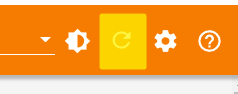

## Импортирование необходимых библиотек

In [1]:
#!pip install torchsummary
import time
import numpy as np
import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, Dataset, DataLoader
from torchsummary import summary
from torchvision import transforms as T
from tensorflow import summary as tfsummary
import pickle
from sklearn.metrics import classification_report
from PIL import Image
from tqdm.auto import tqdm
from IPython.display import clear_output
import matplotlib.pyplot as plt
%matplotlib inline
%load_ext tensorboard

# Часть 1. Классификация изображений CIFAR100 с регуляризацией и аугментацией

## Определяем видеокарту GPU, чтобы на ней учить нейронную сеть

In [2]:
!nvidia-smi

Sat Mar 22 17:24:23 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   78C    P0             37W /   70W |     450MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Загрузка и распаковка набора данных CIFAR100

In [4]:
!wget https://www.cs.toronto.edu/~kriz/cifar-100-python.tar.gz
!tar -xvzf cifar-100-python.tar.gz

--2025-03-22 17:24:23--  https://www.cs.toronto.edu/~kriz/cifar-100-python.tar.gz
Resolving www.cs.toronto.edu (www.cs.toronto.edu)... 128.100.3.30
Connecting to www.cs.toronto.edu (www.cs.toronto.edu)|128.100.3.30|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 169001437 (161M) [application/x-gzip]
Saving to: ‘cifar-100-python.tar.gz.5’

cifar-100-python.ta 100%[===================>] 161.17M  46.9MB/s    in 3.8s    

2025-03-22 17:24:28 (41.9 MB/s) - ‘cifar-100-python.tar.gz.5’ saved [169001437/169001437]

cifar-100-python/
cifar-100-python/file.txt~
cifar-100-python/train
cifar-100-python/test
cifar-100-python/meta


## Чтение тренировочной и тестовой выборки

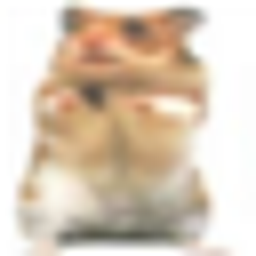

In [5]:
with open('cifar-100-python/train', 'rb') as f:
    data_train = pickle.load(f, encoding='latin1')
with open('cifar-100-python/test', 'rb') as f:
    data_test = pickle.load(f, encoding='latin1')

# Здесь указать ваши классы по варианту!!!
CLASSES = [36, 38, 43]

train_X = data_train['data'].reshape(-1, 3, 32, 32)
train_X = np.transpose(train_X, [0, 2, 3, 1]) # NCHW -> NHWC
train_y = np.array(data_train['fine_labels'])
mask = np.isin(train_y, CLASSES)
train_X = train_X[mask].copy()
train_y = train_y[mask].copy()
train_y = np.unique(train_y, return_inverse=1)[1]
del data_train

test_X = data_test['data'].reshape(-1, 3, 32, 32)
test_X = np.transpose(test_X, [0, 2, 3, 1])
test_y = np.array(data_test['fine_labels'])
mask = np.isin(test_y, CLASSES)
test_X = test_X[mask].copy()
test_y = test_y[mask].copy()
test_y = np.unique(test_y, return_inverse=1)[1]
del data_test
Image.fromarray(train_X[50]).resize((256,256))

## Аугментация данных

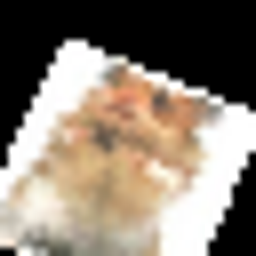

In [47]:
class CifarDataset(Dataset):
     def __init__(self, X, y, transform=None, p=0.0):
         assert X.size(0) == y.size(0)
         super(Dataset, self).__init__()
         self.X = X
         self.y = y
         self.transform = transform
         self.prob = p

     def __len__(self):
         return self.y.size(0)

     def __getitem__(self, index):
        x = self.X[index]
        if self.transform and np.random.random()<self.prob:
            x = self.transform(x.permute(2, 0, 1)/255.).permute(1, 2, 0)*255.
        y = self.y[index]
        return x, y


# ОБЫЧНАЯ
# transform = T.Compose([
#      T.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.2, hue=0.0),
#      T.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.8, 1.2),
#                     shear=5),
# ])


# СМЕНА ПОЛОЖЕНИЯ КАРТИНКИ
# transform = T.Compose([
#     T.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.8, 1.2), shear=5)
# ])

# transform = T.Compose([
#     T.RandomAffine(degrees=20, translate=(0.3, 0.3), scale=(0.7, 1.3), shear=8)
# ])

# transform = T.Compose([
#     T.RandomAffine(degrees=25, translate=(0.2, 0.2), scale=(0.7, 1.3), shear=10)
# ])


# СМЕНА НАСТРОЙКИ ЦВЕТА
transform = T.Compose([
    T.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.2, hue=0.0)
])


#transform = T.AutoAugment(T.AutoAugmentPolicy.CIFAR10)

Image.fromarray((transform(torch.Tensor(train_X[50]).permute(2, 0, 1)/255.).\
                 permute(1, 2, 0).numpy()*255.).astype(np.uint8)).\
                 resize((256, 256))

## Создание Pytorch DataLoader'a

In [48]:
batch_size = 128
dataloader = {}
for (X, y), part in zip([(train_X, train_y), (test_X, test_y)],
                        ['train', 'test']):
    tensor_x = torch.Tensor(X)
    tensor_y = F.one_hot(torch.Tensor(y).to(torch.int64),
                                     num_classes=len(CLASSES))/1.
    dataset = CifarDataset(tensor_x, tensor_y,
                           transform if part=='train' else None,
                           p=0.5) # создание объекта датасета
    dataloader[part] = DataLoader(dataset, batch_size=batch_size,
                                  prefetch_factor=8 if part=='train' else 2,
                                  num_workers=2, persistent_workers=True,
                                  shuffle=True) # создание экземпляра класса DataLoader
dataloader

{'train': <torch.utils.data.dataloader.DataLoader at 0x7bfb25f9b3d0>,
 'test': <torch.utils.data.dataloader.DataLoader at 0x7bfaf8103b10>}

## Создание Pytorch модели многослойного перцептрона с одним скрытым слоем

In [49]:
class Normalize(nn.Module):
    def __init__(self, mean, std):
        super(Normalize, self).__init__()
        self.mean = torch.tensor(mean).to(device)
        self.std = torch.tensor(std).to(device)

    def forward(self, input):
        x = input / 255.0
        x = x - self.mean
        x = x / self.std
        return x.permute(0, 3, 1, 2) # nhwc -> nm

class GlobalMaxPool2d(nn.Module):
    def __init__(self):
        super(GlobalMaxPool2d, self).__init__()

    def forward(self, input):
        out = F.adaptive_max_pool2d(input, output_size=1)
        return out.flatten(start_dim=1)

class Cifar100_CNN(nn.Module):
    def __init__(self, hidden_size=32, classes=3, p1=0.1, p2=0.2):
        super(Cifar100_CNN, self).__init__()
        self.seq = nn.Sequential(
            Normalize([0.5074, 0.4867, 0.4411], [0.2011, 0.1987, 0.2025]),

            nn.Conv2d(3, hidden_size, kernel_size=5, stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=4, stride=4),
            nn.Dropout2d(p=p1),

            nn.Conv2d(hidden_size, hidden_size * 2, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=4, stride=4),
            nn.Dropout2d(p=p2),

            nn.Flatten(),
            nn.Linear(hidden_size * 2 * 2 * 2, classes),  # т.к. после 2x Pool 32→8→2
        )

    def forward(self, x):
        return self.seq(x)

HIDDEN_SIZE = 64 # в 4 раза больше параметров, чем у свёрточной модели из ЛР2
model = Cifar100_CNN(hidden_size=HIDDEN_SIZE, classes=len(CLASSES))
# NEW
model.to(device)
print(model(torch.rand(1, 32, 32, 3).to(device)))
summary(model, input_size=(32, 32, 3))
model

tensor([[ 0.0675, -0.1753,  0.4043]], device='cuda:0',
       grad_fn=<AddmmBackward0>)
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
         Normalize-1            [-1, 3, 32, 32]               0
            Conv2d-2           [-1, 64, 32, 32]           4,864
              ReLU-3           [-1, 64, 32, 32]               0
         MaxPool2d-4             [-1, 64, 8, 8]               0
         Dropout2d-5             [-1, 64, 8, 8]               0
            Conv2d-6            [-1, 128, 8, 8]          73,856
              ReLU-7            [-1, 128, 8, 8]               0
         MaxPool2d-8            [-1, 128, 2, 2]               0
         Dropout2d-9            [-1, 128, 2, 2]               0
          Flatten-10                  [-1, 512]               0
           Linear-11                    [-1, 3]           1,539
Total params: 80,259
Trainable params: 80,259
Non-trainable params: 0
---------

Cifar100_CNN(
  (seq): Sequential(
    (0): Normalize()
    (1): Conv2d(3, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (2): ReLU()
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
    (4): Dropout2d(p=0.1, inplace=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU()
    (7): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
    (8): Dropout2d(p=0.2, inplace=False)
    (9): Flatten(start_dim=1, end_dim=-1)
    (10): Linear(in_features=512, out_features=3, bias=True)
  )
)

## Создание файла логов для Tensorboard

In [50]:
current_time = str(int(time.time()))
train_log_dir = 'logs/tensorboard/train/' + current_time
test_log_dir = 'logs/tensorboard/test/' + current_time
train_summary_writer = tfsummary.create_file_writer(train_log_dir)
test_summary_writer = tfsummary.create_file_writer(test_log_dir)

## Выбор функции потерь и оптимизатора градиентного спуска

In [51]:
# добавляем сглаживание целевых меток, это увеличит значение функции потерь
# но полученная модель будет более устойчивой к выбросам в обучающей выборке
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
# используется SGD c momentum и L2-регуляризацией весов
optimizer = optim.SGD(model.parameters(), lr=3e-3, momentum=0.9,
                      weight_decay=1e-5)
# добавляем постепенное уменьшение шага обучения каждые 200 эпох
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=240, gamma=0.5)

## Магическая команда для запуска Tensorboard в Jupyter Notebook

In [35]:
%tensorboard --logdir logs/tensorboard

Reusing TensorBoard on port 6006 (pid 49196), started 0:34:13 ago. (Use '!kill 49196' to kill it.)

<IPython.core.display.Javascript object>

## Обучение модели по эпохам

Эпоха: 500
Лучшая доля правильных ответов: 88.58901723225911
Текущая доля правильных ответов: 86.31628926595052


  0%|          | 0/6000 [00:00<?, ?it/s]

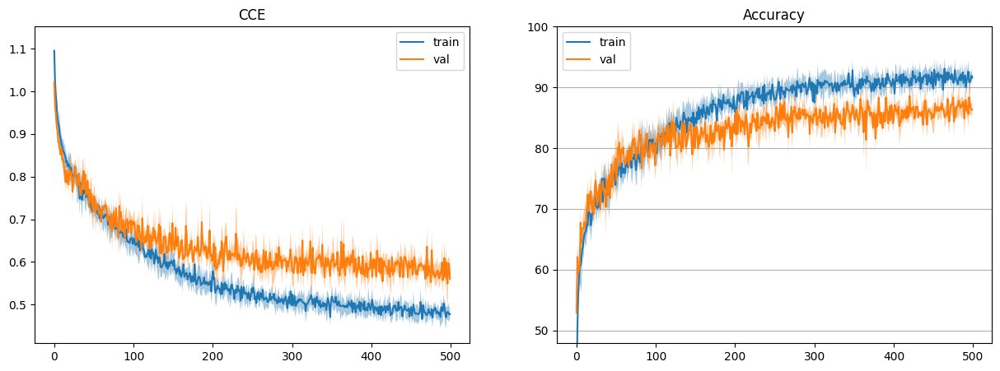

Обучение закончено за 366.3834021091461 секунд


In [52]:
EPOCHS = 500
REDRAW_EVERY = 20
steps_per_epoch = len(dataloader['train'])
steps_per_epoch_val = len(dataloader['test'])
# NEW
pbar = tqdm(total=EPOCHS*steps_per_epoch)
losses = []
losses_val = []
passed = 0
# для создания чекпоинта
best_acc = 0
checkpoint_path = 'cifar_cnn_aug.pth'
for epoch in range(EPOCHS):  # проход по набору данных несколько раз
    tmp = []
    model.train()
    for i, batch in enumerate(dataloader['train'], 0):
        # получение одного минибатча; batch это двуэлементный список из [inputs, labels]
        inputs, labels = batch
        # на GPU
        inputs, labels = inputs.to(device), labels.to(device)

        # очищение прошлых градиентов с прошлой итерации
        optimizer.zero_grad()

        # прямой + обратный проходы + оптимизация
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        #loss = F.cross_entropy(outputs, labels)
        loss.backward()
        optimizer.step()

        # для подсчёта статистик
        accuracy = (labels.detach().argmax(dim=-1)==outputs.detach().argmax(dim=-1)).\
                    to(torch.float32).mean().cpu()*100
        tmp.append((loss.item(), accuracy.item()))
        pbar.update(1)
        # запись в tensorboard
        with train_summary_writer.as_default():
            tfsummary.scalar('loss', tmp[-1][0], step=pbar.n)
            tfsummary.scalar('accuracy', tmp[-1][1], step=pbar.n)
    losses.append((np.mean(tmp, axis=0),
                   np.percentile(tmp, 25, axis=0),
                   np.percentile(tmp, 75, axis=0)))
    scheduler.step() # обновляем learning_rate каждую эпоху
    tmp = []
    model.eval()
    with torch.no_grad(): # отключение автоматического дифференцирования
        for i, data in enumerate(dataloader['test'], 0):
            inputs, labels = data
            # на GPU
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            accuracy = (labels.argmax(dim=-1)==outputs.argmax(dim=-1)).\
                        to(torch.float32).mean().cpu()*100
            tmp.append((loss.item(), accuracy.item()))
    losses_val.append((np.mean(tmp, axis=0),
                       np.percentile(tmp, 25, axis=0),
                       np.percentile(tmp, 75, axis=0)))
    # запись в tensorboard
    with test_summary_writer.as_default():
        tfsummary.scalar('loss', losses_val[-1][0][0], step=pbar.n)
        tfsummary.scalar('accuracy', losses_val[-1][0][1], step=pbar.n)
    # сохранение чекпоинта
    acc = losses_val[-1][0][1]
    if acc > best_acc:
        best_acc = acc
        torch.save(model.state_dict(), checkpoint_path)
    # обновление графиков
    if (epoch+1) % REDRAW_EVERY != 0:
        continue
    clear_output(wait=False)
    print('Эпоха: %s\n'
          'Лучшая доля правильных ответов: %s\n'
          'Текущая доля правильных ответов: %s' % (epoch+1, best_acc, acc))
    passed += pbar.format_dict['elapsed']
    pbar = tqdm(total=EPOCHS*steps_per_epoch, miniters=5)
    pbar.update((epoch+1)*steps_per_epoch)
    x_vals = np.arange(epoch+1)
    _, ax = plt.subplots(1, 2, figsize=(15, 5))
    stats = np.array(losses)
    stats_val = np.array(losses_val)
    ax[1].set_ylim(stats_val[:, 0, 1].min()-5, 100)
    ax[1].grid(axis='y')
    for i, title in enumerate(['CCE', 'Accuracy']):
        ax[i].plot(x_vals, stats[:, 0, i], label='train')
        ax[i].fill_between(x_vals, stats[:, 1, i],
                           stats[:, 2, i], alpha=0.4)
        ax[i].plot(x_vals, stats_val[:, 0, i], label='val')
        ax[i].fill_between(x_vals,
                           stats_val[:, 1, i],
                           stats_val[:, 2, i], alpha=0.4)
        ax[i].legend()
        ax[i].set_title(title)
    plt.show()
model.load_state_dict(torch.load(checkpoint_path))
print('Обучение закончено за %s секунд' % passed)

## Проверка качества модели по классам на обучающей и тестовой выборках

In [53]:
batch_size = 128
dataloader = {}
for (X, y), part in zip([(train_X, train_y), (test_X, test_y)],
                        ['train', 'test']):
    tensor_x = torch.Tensor(X)
    tensor_y = F.one_hot(torch.Tensor(y).to(torch.int64),
                                     num_classes=len(CLASSES))/1.
    dataset = CifarDataset(tensor_x, tensor_y,
                           transform=None,
                           p=0.0) # создание объекта датасета
    dataloader[part] = DataLoader(dataset, batch_size=batch_size,
                                  num_workers=2, shuffle=True) # создание экземпляра класса DataLoader
dataloader

{'train': <torch.utils.data.dataloader.DataLoader at 0x7bfad1de95d0>,
 'test': <torch.utils.data.dataloader.DataLoader at 0x7bfad4098710>}

In [54]:
for part in ['train', 'test']:
    y_pred = []
    y_true = []
    with torch.no_grad(): # отключение автоматического дифференцирования
        for i, data in enumerate(dataloader[part], 0):
            inputs, labels = data
             # на GPU
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs).detach().cpu().numpy()
            y_pred.append(outputs)
            y_true.append(labels.cpu().numpy())
        y_true = np.concatenate(y_true)
        y_pred = np.concatenate(y_pred)
        print(part)
        print(classification_report(y_true.argmax(axis=-1), y_pred.argmax(axis=-1),
                                    digits=4, target_names=list(map(str, CLASSES))))
        print('-'*50)

train
              precision    recall  f1-score   support

          36     1.0000    0.9960    0.9980       500
          38     0.9960    1.0000    0.9980       500
          43     1.0000    1.0000    1.0000       500

    accuracy                         0.9987      1500
   macro avg     0.9987    0.9987    0.9987      1500
weighted avg     0.9987    0.9987    0.9987      1500

--------------------------------------------------
test
              precision    recall  f1-score   support

          36     0.9877    0.8000    0.8840       100
          38     0.8302    0.8800    0.8544       100
          43     0.8142    0.9200    0.8638       100

    accuracy                         0.8667       300
   macro avg     0.8773    0.8667    0.8674       300
weighted avg     0.8773    0.8667    0.8674       300

--------------------------------------------------


# Часть 2. Сохранение модели в ONNX

In [ ]:
# сохраниение модели
# ПЕРВЫЙ СПОСОБ: сохранение параметров
PATH = 'cifar_cnn_aug.pth'
torch.save(model.state_dict(), PATH)
# загрузка
new_model = Cifar100_CNN(hidden_size=HIDDEN_SIZE, classes=len(CLASSES))
new_model.load_state_dict(torch.load(PATH))
new_model.eval()

# ВТОРОЙ СПОСОБ: сохранение всей архитектуры
PATH2 = 'cifar_cnn_aug.pt'
torch.save(model, PATH2)
# загрузка
new_model_2 = torch.load(PATH2)
new_model_2.eval()

In [ ]:
!pip install onnx

In [ ]:
# входной тензор для модели
x = torch.randn(1, 32, 32, 3, requires_grad=True).to(device)
torch_out = model(x)

# экспорт модели
torch.onnx.export(model,               # модель
                  x,                   # входной тензор (или кортеж нескольких тензоров)
                  "cifar100_CNN_AUG.onnx", # куда сохранить (либо путь к файлу либо fileObject)
                  export_params=True,  # сохраняет веса обученных параметров внутри файла модели
                  opset_version=9,     # версия ONNX
                  do_constant_folding=True,  # следует ли выполнять укорачивание констант для оптимизации
                  input_names = ['input'],   # имя входного слоя
                  output_names = ['output'],  # имя выходного слоя
                  dynamic_axes={'input' : {0 : 'batch_size'},    # динамичные оси, в данном случае только размер пакета
                                'output' : {0 : 'batch_size'}})